## Finding the best London borough to live in

For many people, moving to London can be a daunting task. As a large city, there are many locations to consider when finding a new home, each with different attributes.

In this project, I explore the London boroughs and compare them using several features that may be important to someone considering a move. The boroughs are then grouped into clusters to determine the most desirable boroughs to live in.

N.B. folium maps will not display when viewed on GitHub

In [1]:
# Import all dependencies
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import numpy as np

from collections import Counter

import requests
from pandas.io.json import json_normalize

import geopandas as gpd

from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

from shapely.geometry import shape, Point

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors

import seaborn as sns

import json

import folium

from sklearn.cluster import KMeans

#### Load in and clean up crime data from Feb 2018 - Jan 2020

In [2]:
crime = pd.read_csv('https://data.london.gov.uk/download/recorded_crime_summary/d2e9ccfc-a054-41e3-89fb-53c2bc3ed87a/MPS%20Borough%20Level%20Crime%20%28most%20recent%2024%20months%29.csv')
crime.rename(columns={'LookUp_BoroughName':'Borough'}, inplace=True)

# Total crimes for each borough
crime = crime.groupby(['Borough']).sum()
crime['total'] = crime.sum(axis=1)

# Remove Heathrow borough
crime.drop(index='London Heathrow and London City Airports', axis=0, inplace=True)

crime_total = pd.DataFrame({'Borough':crime.index, 'Total Crimes':crime.total}).reset_index(drop=True)
crime_total

,Borough,Total Crimes
0,Barking and Dagenham,38627
1,Barnet,60050
2,Bexley,33747
3,Brent,61041
4,Bromley,48439
5,Camden,75501
6,Croydon,65247
7,Ealing,60402
8,Enfield,58864
9,Greenwich,54770


#### Load in and clean up NO2 emission data from 2013

In [3]:
air_pol = pd.read_excel('https://data.london.gov.uk/download/analysing-air-pollution-exposure-in-london/63404327-f3a5-4a15-b003-3a95fd27b497/ListofSchools_LAEI2013.xlsx', sheet_name='List of schools', skiprows=[0,1,2])

air_pol.drop('Unnamed: 0', axis=1, inplace=True)
air_pol.rename(columns={'Local Authority name':'Borough'}, inplace=True)

air_pol_mean = air_pol.copy()
air_pol_mean = air_pol_mean.groupby(['Borough'])['NO2ug/m3 mean 2013'].mean()
air_pol_mean = air_pol_mean.to_frame().reset_index()

air_pol_mean = air_pol_mean.rename(columns={'NO2ug/m3 mean 2013':'NO2_value'})
# air_pol_sort = air_pol_mean.sort_values(by=['NO2ug/m3 mean 2013'])

air_pol_mean

,Borough,NO2_value
0,Barking and Dagenham,31.628571
1,Barnet,33.815758
2,Bexley,29.740698
3,Brent,36.072115
4,Bromley,28.770732
5,Camden,44.848214
6,City of London,53.357143
7,Croydon,31.518831
8,Ealing,36.313559
9,Enfield,31.524299


Worth noting that 40 µg/m3 is the upper limit value set by the EU.
##### We can use this to create a column that shows whether a given borough exceeds the EU limit.

In [4]:
exceed = []

for i in range(0, air_pol_mean.shape[0]):
    if air_pol_mean.iloc[i,1]>40:
        exceed.append(1)
    else:
        exceed.append(0)

air_pol_mean['exceed_NO2'] = exceed
air_pol_mean.head(10)

,Borough,NO2_value,exceed_NO2
0,Barking and Dagenham,31.628571,0
1,Barnet,33.815758,0
2,Bexley,29.740698,0
3,Brent,36.072115,0
4,Bromley,28.770732,0
5,Camden,44.848214,1
6,City of London,53.357143,1
7,Croydon,31.518831,0
8,Ealing,36.313559,0
9,Enfield,31.524299,0


#### Parse wikipedia table to get more information for each borough

In [5]:
df = pd.read_html('https://en.wikipedia.org/wiki/List_of_London_boroughs', header=0)[0]
df.drop(columns=['Inner', 'Status', 'Local authority', 'Headquarters', 'Nr. in map'], axis=1, inplace=True)

# Get rid of footnotes
for a in range(0,df.shape[0]):
    for b in range(0, df.shape[1]):
        if '[' in str(df.iloc[a,b]):
            df.iloc[a,b] = (df.iloc[a,b].split('[')[0])

# Break up co-ordinates into latitude and longitude            
for row in range(0, df.shape[0]):
    df['Co-ordinates'][row] = df['Co-ordinates'][row].split('/')[1]
            
lat = []
lon = []

for cor in df['Co-ordinates']:
    lat.append(float((cor.split('°N')[0]).split('\ufeff')[1]))
    
for cor in df['Co-ordinates']:
    direction = cor.split('°N')[1].split('°')[1]
    if direction == 'W':
        lon.append(float((cor.split('°N')[1].split('°')[0]).split()[0])*-1) # If W, the longitude is negative
    else:
        lon.append(float((cor.split('°N')[1].split('°')[0]).split()[0]))
        
df['Latitude'] = lat
df['Longitude'] = lon
df = df.drop(columns=['Co-ordinates'])

# Clean up any inconsistent values    
df.replace('Conservative (council NOC)','Conservative', inplace=True)

df.rename(columns={'Population (2013 est)[1]':'Population_2013'}, inplace=True)

# Remove any spaces at end of borough name
df['Borough'] = df['Borough'].str.rstrip()

df.head()

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':


,Borough,Political control,Area (sq mi),Population_2013,Latitude,Longitude
0,Barking and Dagenham,Labour,13.93,194352,51.5607,0.1557
1,Barnet,Conservative,33.49,369088,51.6252,-0.1517
2,Bexley,Conservative,23.38,236687,51.4549,0.1505
3,Brent,Labour,16.70,317264,51.5588,-0.2817
4,Bromley,Conservative,57.97,317899,51.4039,0.0198


#### Merge the three dataframes

In [6]:
borough_df = pd.merge(crime_total, air_pol_mean, on='Borough', how='left')
borough_df = pd.merge(borough_df, df, on='Borough', how='left')
borough_df.head()

,Borough,Total Crimes,NO2_value,exceed_NO2,Political control,Area (sq mi),Population_2013,Latitude,Longitude
0,Barking and Dagenham,38627,31.628571,0,Labour,13.93,194352,51.5607,0.1557
1,Barnet,60050,33.815758,0,Conservative,33.49,369088,51.6252,-0.1517
2,Bexley,33747,29.740698,0,Conservative,23.38,236687,51.4549,0.1505
3,Brent,61041,36.072115,0,Labour,16.70,317264,51.5588,-0.2817
4,Bromley,48439,28.770732,0,Conservative,57.97,317899,51.4039,0.0198


#### Update dataframe with more recent population values and add average age data

Population data is an estimate for 2017

In [7]:
borough2017 = pd.read_csv('boroughdata2017.csv')
borough_df = pd.merge(borough_df, borough2017, on='Borough', how='left')
borough_df = borough_df.drop('Population_2013', axis=1)
borough_df = borough_df.rename(columns={'PopulationEstimate_2017':'Population', 'AverageAge_2017':'Average Age'})
borough_df.head()

,Borough,Total Crimes,NO2_value,exceed_NO2,Political control,Area (sq mi),Latitude,Longitude,Population,Average Age
0,Barking and Dagenham,38627,31.628571,0,Labour,13.93,51.5607,0.1557,209000,32.9
1,Barnet,60050,33.815758,0,Conservative,33.49,51.6252,-0.1517,389600,37.3
2,Bexley,33747,29.740698,0,Conservative,23.38,51.4549,0.1505,244300,39.0
3,Brent,61041,36.072115,0,Labour,16.70,51.5588,-0.2817,332100,35.6
4,Bromley,48439,28.770732,0,Conservative,57.97,51.4039,0.0198,327900,40.2


#### Load in and clean up house price data

In [8]:
house_price = pd.read_csv('https://data.london.gov.uk/download/average-house-prices/b1b0079e-698c-4c0b-b8c7-aa6189590ca4/land-registry-house-prices-borough.csv')
house_price.head()

,Code,Area,Year,Measure,Value
0,E09000001,City of London,Year ending Dec 1995,Median,"105,000"
1,E09000002,Barking and Dagenham,Year ending Dec 1995,Median,"49,000"
2,E09000003,Barnet,Year ending Dec 1995,Median,"85,125"
3,E09000004,Bexley,Year ending Dec 1995,Median,"62,000"
4,E09000005,Brent,Year ending Dec 1995,Median,"68,000"


In [9]:
# Find the most recent year in the Year column
house_price['Year'].unique()[-1]

'Year ending Dec 2017'

In [10]:
# Create a dataframe for the median house price from the most recent year
house_price_med = house_price[house_price.Measure == 'Median']
house_price_med = house_price_med[house_price_med.Year=='Year ending Dec 2017']

# Select all apart from City of London
house_price_med = house_price_med.iloc[1:33]

# Clean up dataframe
house_price_med.reset_index(drop=True, inplace=True)
house_price_med.drop(columns=['Code','Year','Measure'], axis=1, inplace=True)
house_price_med.rename(columns={'Area':'Borough','Value':'Median House Price'}, inplace=True)

# Remove commas so we can turn the prices into integers
house_price_med['Median House Price'] = house_price_med['Median House Price'].str.replace(',','').astype(int)

house_price_med.head()

,Borough,Median House Price
0,Barking and Dagenham,300000
1,Barnet,533500
2,Bexley,342500
3,Brent,499950
4,Bromley,440000


In [11]:
# Merge house price data with existing dataframe
borough_df = pd.merge(borough_df, house_price_med, on='Borough', how='left')
borough_df.head()

,Borough,Total Crimes,NO2_value,exceed_NO2,Political control,Area (sq mi),Latitude,Longitude,Population,Average Age,Median House Price
0,Barking and Dagenham,38627,31.628571,0,Labour,13.93,51.5607,0.1557,209000,32.9,300000
1,Barnet,60050,33.815758,0,Conservative,33.49,51.6252,-0.1517,389600,37.3,533500
2,Bexley,33747,29.740698,0,Conservative,23.38,51.4549,0.1505,244300,39.0,342500
3,Brent,61041,36.072115,0,Labour,16.70,51.5588,-0.2817,332100,35.6,499950
4,Bromley,48439,28.770732,0,Conservative,57.97,51.4039,0.0198,327900,40.2,440000


#### Load in and clean up school data from 2016

In [12]:
school_loc = pd.read_csv('https://data.london.gov.uk/download/london-schools-atlas/57046151-39a0-45d9-8dc0-27ea7fd02de8/all_schools_xy_2016.csv')
school_loc.head()

,OBJECTID,URN,SCHOOL_NAM,TYPE,PHASE,ADDRESS,TOWN,POSTCODE,STATUS,GENDER,EASTING,NORTHING,WARD_NAME,LSOA_NAME,LA_NAME,WEBLINK,AGE,map_icon,NEW_URN,OLD_URN,map_icon_l,Primary,x,y
0,1,135155,Ayesha Siddiqa Girls School,Other Independent School,Not applicable,165-169 The Broadway,Southall,UB1 1LR,Open,Girls,521263,180470,Southall Broadway,Ealing 026C,Ealing,,19-Nov,,,,2,0,-0.378496,51.507500
1,2,140492,Beis Medrash Elyon,Other Independent School,Not applicable,233 West Hendon Broadway,London,NW9 7DG,Open,Boys,521939,188148,West Hendon,Barnet 036F,Barnet,,16-Nov,,,,2,0,-0.241628,51.578999
2,3,141411,Big Creative Independent School,Other Independent School,Not applicable,Silver Birch House,Walthamstow,E17 5SD,Open,Mixed,535764,190188,Higham Hill,Waltham Forest 014C,Waltham Forest,,15 - 16,,,,2,0,-0.042590,51.594002
3,4,142336,Wetherby Senior School,Other Independent School,Not applicable,100 Marylebone Lane,London,W1U 2QB,Open,Boys,528432,181474,Marylebone High Street,Westminster 011B,Westminster,,16-Nov,,,,2,0,-0.150409,51.517601
4,5,100042,St Mary's Kilburn Church of England Primary Sc...,Voluntary Aided School,Primary,Quex Road,London,NW6 4PG,Open,Mixed,525453,183984,Kilburn,Camden 020C,Camden,http://www.stmarykilburn.camden.sch.uk/,11-Mar,VOLUNTARY,,,2,1,-0.193367,51.540402


In [13]:
# Drop any unnecessary columns
school_df = school_loc.drop(columns=['OBJECTID',
                                     'URN',
                                     'ADDRESS',
                                     'TOWN',
                                     'EASTING',
                                     'NORTHING',
                                     'WARD_NAME',
                                     'LSOA_NAME',
                                     'WEBLINK',
                                     'AGE',
                                     'map_icon',
                                     'NEW_URN',
                                     'OLD_URN',
                                     'map_icon_l'])

# Remove any schools that have been closed
school_df = school_df.loc[school_df.STATUS == 'Open']

# Rename to Borough to allow for simple merging later
school_df.rename(columns={'LA_NAME':'Borough'}, inplace=True)

# Show how many schools in each borough
school_df['Borough'].value_counts()

Barnet                    163
Croydon                   146
Hackney                   129
Wandsworth                126
Bromley                   125
Hillingdon                123
Ealing                    122
Southwark                 116
Tower Hamlets             114
Enfield                   111
Camden                    108
Newham                    103
Lewisham                  103
Brent                     102
Redbridge                 101
Westminster               100
Greenwich                 100
Haringey                   99
Kensington and Chelsea     95
Hounslow                   94
Hammersmith and Fulham     94
Richmond upon Thames       92
Lambeth                    92
Havering                   91
Bexley                     85
Waltham Forest             84
Merton                     82
Harrow                     73
Islington                  69
Sutton                     68
Barking and Dagenham       64
Kingston upon Thames       60
Hertsmere                  60
Elmbridge 

In [14]:
# Make a dataframe that only includes the 32 boroughs
schools_inner = pd.merge(borough_df['Borough'], school_df, on='Borough', how='left')

# Use this dataframe to make a new dataframe with all number of schools for each borough
school_count = schools_inner['Borough'].value_counts().to_frame().reset_index().rename(columns={'index':'Borough','Borough':'School Count'})

# To confirm we only have 32 boroughs
print('Number of boroughs: ', school_count.shape[0])

school_count.head()

Number of boroughs:  32


,Borough,School Count
0,Barnet,163
1,Croydon,146
2,Hackney,129
3,Wandsworth,126
4,Bromley,125


In [15]:
# Merge school data with existing dataframe
borough_df = pd.merge(borough_df, school_count, on='Borough', how='left')
borough_df.head()

,Borough,Total Crimes,NO2_value,exceed_NO2,Political control,Area (sq mi),Latitude,Longitude,Population,Average Age,Median House Price,School Count
0,Barking and Dagenham,38627,31.628571,0,Labour,13.93,51.5607,0.1557,209000,32.9,300000,64
1,Barnet,60050,33.815758,0,Conservative,33.49,51.6252,-0.1517,389600,37.3,533500,163
2,Bexley,33747,29.740698,0,Conservative,23.38,51.4549,0.1505,244300,39.0,342500,85
3,Brent,61041,36.072115,0,Labour,16.70,51.5588,-0.2817,332100,35.6,499950,102
4,Bromley,48439,28.770732,0,Conservative,57.97,51.4039,0.0198,327900,40.2,440000,125


#### Normalise crime and school data by population

In [16]:
# Calculate number of crimes per 1000 people
borough_df['Crimes per 1000'] = borough_df['Total Crimes']*1000 / borough_df['Population']

# Calculate number of schools per 1000 people
borough_df['Schools per 1000'] = borough_df['School Count']*1000 / borough_df['Population']

borough_df.head()

,Borough,Total Crimes,NO2_value,exceed_NO2,Political control,Area (sq mi),Latitude,Longitude,Population,Average Age,Median House Price,School Count,Crimes per 1000,Schools per 1000
0,Barking and Dagenham,38627,31.628571,0,Labour,13.93,51.5607,0.1557,209000,32.9,300000,64,184.818182,0.306220
1,Barnet,60050,33.815758,0,Conservative,33.49,51.6252,-0.1517,389600,37.3,533500,163,154.132444,0.418378
2,Bexley,33747,29.740698,0,Conservative,23.38,51.4549,0.1505,244300,39.0,342500,85,138.137536,0.347933
3,Brent,61041,36.072115,0,Labour,16.70,51.5588,-0.2817,332100,35.6,499950,102,183.803071,0.307136
4,Bromley,48439,28.770732,0,Conservative,57.97,51.4039,0.0198,327900,40.2,440000,125,147.724916,0.381214


#### Calculate population density

In [17]:
# Number of people per square mile
borough_df['Pop Density'] = borough_df['Population'] / borough_df['Area (sq mi)']

borough_df.head()

,Borough,Total Crimes,NO2_value,exceed_NO2,Political control,Area (sq mi),Latitude,Longitude,Population,Average Age,Median House Price,School Count,Crimes per 1000,Schools per 1000,Pop Density
0,Barking and Dagenham,38627,31.628571,0,Labour,13.93,51.5607,0.1557,209000,32.9,300000,64,184.818182,0.306220,15003.589375
1,Barnet,60050,33.815758,0,Conservative,33.49,51.6252,-0.1517,389600,37.3,533500,163,154.132444,0.418378,11633.323380
2,Bexley,33747,29.740698,0,Conservative,23.38,51.4549,0.1505,244300,39.0,342500,85,138.137536,0.347933,10449.101796
3,Brent,61041,36.072115,0,Labour,16.70,51.5588,-0.2817,332100,35.6,499950,102,183.803071,0.307136,19886.227545
4,Bromley,48439,28.770732,0,Conservative,57.97,51.4039,0.0198,327900,40.2,440000,125,147.724916,0.381214,5656.373987


#### Reorder columns in the dataframe

In [18]:
order = ['Borough', 'Latitude', 'Longitude', 'Population', 'Area (sq mi)', 'Pop Density', 
         'Average Age', 'Median House Price', 'Political control', 'Total Crimes', 'Crimes per 1000', 
         'School Count', 'Schools per 1000', 'NO2_value', 'exceed_NO2']

borough_df = borough_df[order]
borough_df.head()

,Borough,Latitude,Longitude,Population,Area (sq mi),Pop Density,Average Age,Median House Price,Political control,Total Crimes,Crimes per 1000,School Count,Schools per 1000,NO2_value,exceed_NO2
0,Barking and Dagenham,51.5607,0.1557,209000,13.93,15003.589375,32.9,300000,Labour,38627,184.818182,64,0.306220,31.628571,0
1,Barnet,51.6252,-0.1517,389600,33.49,11633.323380,37.3,533500,Conservative,60050,154.132444,163,0.418378,33.815758,0
2,Bexley,51.4549,0.1505,244300,23.38,10449.101796,39.0,342500,Conservative,33747,138.137536,85,0.347933,29.740698,0
3,Brent,51.5588,-0.2817,332100,16.70,19886.227545,35.6,499950,Labour,61041,183.803071,102,0.307136,36.072115,0
4,Bromley,51.4039,0.0198,327900,57.97,5656.373987,40.2,440000,Conservative,48439,147.724916,125,0.381214,28.770732,0


#### Borough boundary shape data for choropleth maps

In [19]:
fp = "London_Borough_Map/London_Borough_Excluding_MHW.shp"
map_df = gpd.read_file(fp)
map_df.head()

,NAME,GSS_CODE,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006,geometry
0,Kingston upon Thames,E09000021,3726.117,0.000,F,None,None,"POLYGON ((516401.600 160201.800, 516407.300 16..."
1,Croydon,E09000008,8649.441,0.000,F,None,None,"POLYGON ((535009.200 159504.700, 535005.500 15..."
2,Bromley,E09000006,15013.487,0.000,F,None,None,"POLYGON ((540373.600 157530.400, 540361.200 15..."
3,Hounslow,E09000018,5658.541,60.755,F,None,None,"POLYGON ((521975.800 178100.000, 521967.700 17..."
4,Ealing,E09000009,5554.428,0.000,F,None,None,"POLYGON ((510253.500 182881.600, 510249.900 18..."


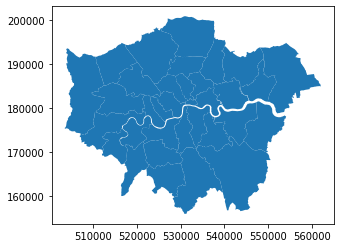

In [20]:
map_df.plot()

In [21]:
map_df.rename(columns={'NAME':'Borough'}, inplace=True)
map_df.drop(['GSS_CODE', 'HECTARES', 'NONLD_AREA', 'ONS_INNER', 'SUB_2009', 'SUB_2006'], axis=1, inplace=True)

borough_df2 = map_df.set_index('Borough').join(borough_df.set_index('Borough'))

borough_df2.drop('City of London', inplace=True)
borough_df2.reset_index(inplace=True)

borough_df2.head()

,Borough,geometry,Latitude,Longitude,Population,Area (sq mi),Pop Density,Average Age,Median House Price,Political control,Total Crimes,Crimes per 1000,School Count,Schools per 1000,NO2_value,exceed_NO2
0,Kingston upon Thames,"POLYGON ((516401.600 160201.800, 516407.300 16...",51.4085,-0.3064,175400.0,14.38,12197.496523,37.1,487250.0,Liberal Democrat,25697.0,146.505131,60.0,0.342075,32.927273,0.0
1,Croydon,"POLYGON ((535009.200 159504.700, 535005.500 15...",51.3714,-0.0977,386500.0,33.41,11568.392697,37.0,365000.0,Labour,65247.0,168.815006,146.0,0.377749,31.518831,0.0
2,Bromley,"POLYGON ((540373.600 157530.400, 540361.200 15...",51.4039,0.0198,327900.0,57.97,5656.373987,40.2,440000.0,Conservative,48439.0,147.724916,125.0,0.381214,28.770732,0.0
3,Hounslow,"POLYGON ((521975.800 178100.000, 521967.700 17...",51.4746,-0.3680,274200.0,21.61,12688.570106,35.8,395000.0,Labour,52447.0,191.272794,94.0,0.342815,35.397778,0.0
4,Ealing,"POLYGON ((510253.500 182881.600, 510249.900 18...",51.5130,-0.3089,351600.0,21.44,16399.253731,36.2,485000.0,Labour,60402.0,171.791809,122.0,0.346985,36.313559,0.0


#### Also loading GeoJSON data for each boundary
We can use this to determine if coordinates are in a given borough, and to draw borough boundary shapes over Folium maps

In [22]:
with open('london_boroughs.json') as f:
        js = json.load(f)

In [23]:
# Find the order of the boroughs in the GeoJSON file
for i in range(0, len(js['features'])):
    print(js['features'][i]['properties']['name'])

Kingston upon Thames
Croydon
Bromley
Hounslow
Ealing
Havering
Hillingdon
Harrow
Brent
Barnet
Lambeth
Southwark
Lewisham
Greenwich
Bexley
Enfield
Waltham Forest
Redbridge
Sutton
Richmond upon Thames
Merton
Wandsworth
Hammersmith and Fulham
Kensington and Chelsea
Westminster
Camden
Tower Hamlets
Islington
Hackney
Haringey
Newham
Barking and Dagenham
City of London


The boroughs are in the same order here as in the dataframe, so we can use the same index value to access the borough name in both.

In [24]:
CLIENT_ID = 'X1MLFRW2LIGOLQFBIW22NAEDBHBW0MNDL21JPNSR4B1014QW' # your Foursquare ID
CLIENT_SECRET = 'E3MR0RSHMI3OW5OFFD0525WUIFXIVGZRUOI32EVTSH2RYITY' # your Foursquare Secret
VERSION = '20202602' # Foursquare API version

In [25]:
# Create a function to identify how many venues of a given category are in each borough
# category_Id and column_name parameters take strings

def get_borough_venues(category_Id, column_name, df=borough_df2): # By default, df will be set to borough_df2 -- our main dataframe
    radius = 5000
    limit = 500

    cat_id = category_Id

    final_list=[]

    # Create a list of polygons corresponding to each borough, to be able to check later if a given coordinate pair is in that polygon
    polygons = []
    for i in range(0, df.shape[0]):
        polygons.append(shape(js['features'][i]['geometry']))

    # Call the API for each borough  
    for x in range(0, df.shape[0]):
        all_lats = []
        all_lons = []
        bor = df.iloc[x,0]
        bor_lat = df.iloc[x,2]
        bor_lon = df.iloc[x,3]

        url = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&ll={},{}&v={}&categoryId={}&intent=browse&radius={}&limit={}'.format(CLIENT_ID, 
                                                                                                                                                               CLIENT_SECRET, 
                                                                                                                                                               bor_lat, 
                                                                                                                                                               bor_lon, 
                                                                                                                                                               VERSION, 
                                                                                                                                                               cat_id,
                                                                                                                                                               radius, 
                                                                                                                                                               limit)

        results = requests.get(url).json()

        # Loop through the venues and add their latitude and longitude values to lists
        for y in range(0, len(results['response']['groups'][0]['items'])):
            all_lats.append(results['response']['groups'][0]['items'][y]['venue']['location']['lat'])
            all_lons.append(results['response']['groups'][0]['items'][y]['venue']['location']['lng'])

        # Each pair of coordinates is now a tuple, which can be used for Point()  
        coord_list = tuple(zip(all_lons, all_lats))

        # Only returns the current borough if the venue coordinates lie within that borough -- prevents overlap due to large radius
        for coord in coord_list:
            point = Point(coord)
            if polygons[x].contains(point):
                final_list.append(bor)
    
    # Counter tells us how many venues were returned for each borough
    venues_per_borough = Counter(final_list)
    
    # Create a column in the dataframe with the count for the category of venues
    venues = []
    for bor in df['Borough']:
        venues.append(venues_per_borough[bor])
    df[column_name] = venues

#### Use created function to append dataframe with counts of certain venues for each borough

##### Category ID:

Parks - '4bf58dd8d48988d163941735'\
Supermarkets - '52f2ab2ebcbc57f1066b8b46'\
Hospitals - '4bf58dd8d48988d196941735'

In [26]:
get_borough_venues('4bf58dd8d48988d163941735', 'Parks')
get_borough_venues('52f2ab2ebcbc57f1066b8b46', 'Supermarkets')
get_borough_venues('4bf58dd8d48988d196941735', 'Hospitals')

borough_df2.head()

,Borough,geometry,Latitude,Longitude,Population,Area (sq mi),Pop Density,Average Age,Median House Price,Political control,Total Crimes,Crimes per 1000,School Count,Schools per 1000,NO2_value,exceed_NO2,Parks,Supermarkets,Hospitals
0,Kingston upon Thames,"POLYGON ((516401.600 160201.800, 516407.300 16...",51.4085,-0.3064,175400.0,14.38,12197.496523,37.1,487250.0,Liberal Democrat,25697.0,146.505131,60.0,0.342075,32.927273,0.0,17,15,8
1,Croydon,"POLYGON ((535009.200 159504.700, 535005.500 15...",51.3714,-0.0977,386500.0,33.41,11568.392697,37.0,365000.0,Labour,65247.0,168.815006,146.0,0.377749,31.518831,0.0,29,21,5
2,Bromley,"POLYGON ((540373.600 157530.400, 540361.200 15...",51.4039,0.0198,327900.0,57.97,5656.373987,40.2,440000.0,Conservative,48439.0,147.724916,125.0,0.381214,28.770732,0.0,24,18,5
3,Hounslow,"POLYGON ((521975.800 178100.000, 521967.700 17...",51.4746,-0.3680,274200.0,21.61,12688.570106,35.8,395000.0,Labour,52447.0,191.272794,94.0,0.342815,35.397778,0.0,13,17,5
4,Ealing,"POLYGON ((510253.500 182881.600, 510249.900 18...",51.5130,-0.3089,351600.0,21.44,16399.253731,36.2,485000.0,Labour,60402.0,171.791809,122.0,0.346985,36.313559,0.0,34,18,5


#### Create choropleth maps for some variables to visualise differences between boroughs

In [27]:
# Function to draw map and save png file
def l_map(var, vmin, vmax, cmap, title, source, export_file):
    fig, ax = plt.subplots(1, figsize=(10, 6))
    ax.axis('off')
    ax.set_title(title, fontdict={'fontsize':'20', 'fontweight':'3'})
    ax.annotate(source, xy=(0.1,0.08),  xycoords='figure fraction', 
            horizontalalignment='left', verticalalignment='top', fontsize=10, color='#555555')
    
    # Create colour bar as a legend
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
    
    # Empty array for the data range
    sm._A = []
    
    # Add the colour bar to the figure
    cbar = fig.colorbar(sm)
    
    borough_df2.plot(column=var, cmap=cmap, linewidth=0.8, ax=ax, edgecolor='0.7')
    
    fig.savefig('Figures/{}.png'.format(export_file), dpi=300)

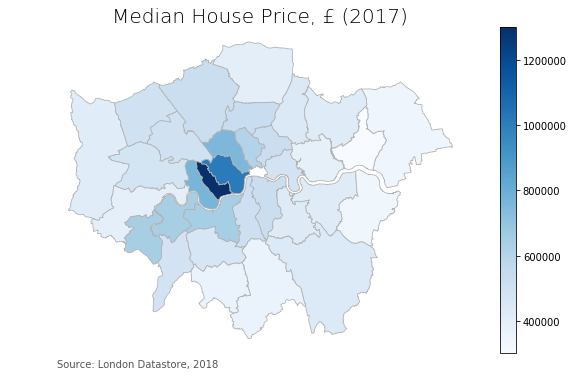

In [28]:
l_map('Median House Price', 300000, 1300000, 'Blues', 'Median House Price, £ (2017)', 'Source: London Datastore, 2018', 'house_price')

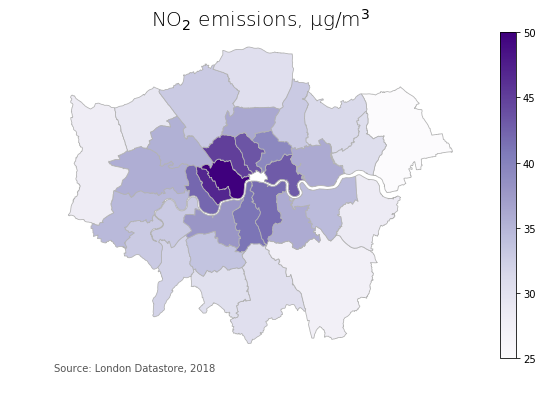

In [29]:
l_map('NO2_value', 25, 50, 'Purples', 'NO$_2$ emissions, µg/m$^3$', 'Source: London Datastore, 2018', 'no2_emissions')

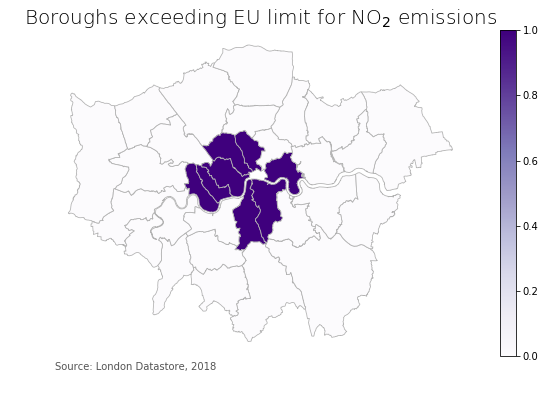

In [30]:
l_map('exceed_NO2', 0, 1, 'Purples', 'Boroughs exceeding EU limit for NO$_2$ emissions', 'Source: London Datastore, 2018', 'no2_exceed')

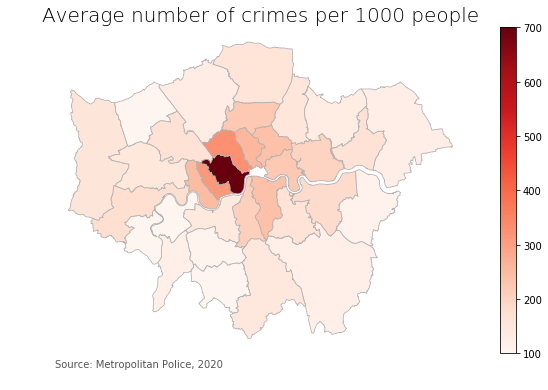

In [31]:
l_map('Crimes per 1000', 100, 700, 'Reds', 'Average number of crimes per 1000 people', 'Source: Metropolitan Police, 2020', 'crime_per_pop')

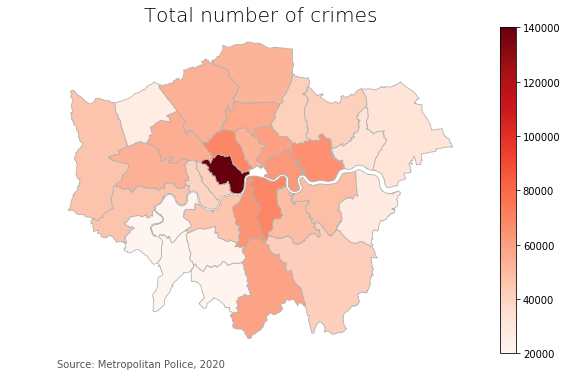

In [32]:
l_map('Total Crimes', 20000, 140000, 'Reds', 'Total number of crimes', 'Source: Metropolitan Police, 2020', 'crime_total')

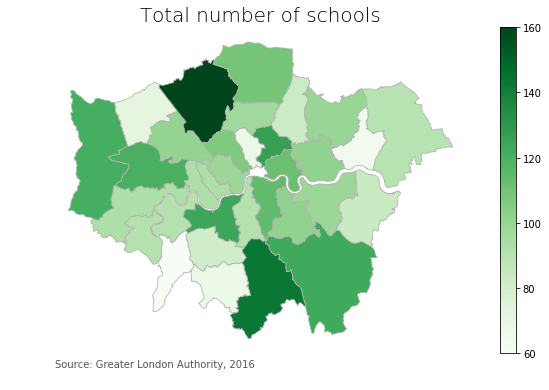

In [33]:
l_map('School Count', 60, 160, 'Greens', 'Total number of schools', 'Source: Greater London Authority, 2016', 'schools_count')

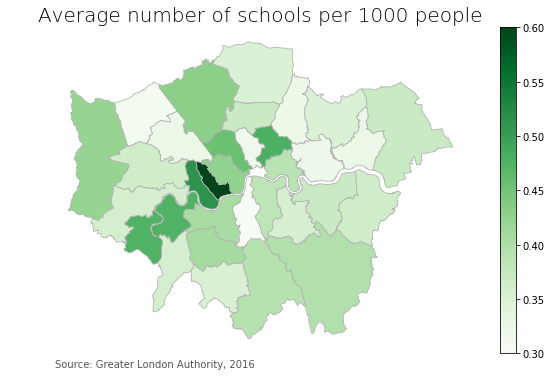

In [34]:
l_map('Schools per 1000', 0.3, 0.6, 'Greens', 'Average number of schools per 1000 people', 'Source: Greater London Authority, 2016', 'schools_per_1000')

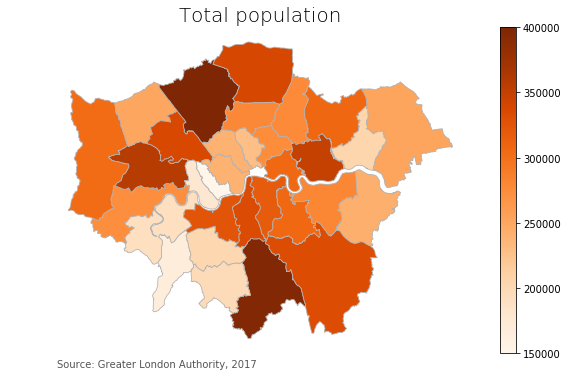

In [35]:
l_map('Population', 150000, 400000, 'Oranges', 'Total population', 'Source: Greater London Authority, 2017', 'total_pop')

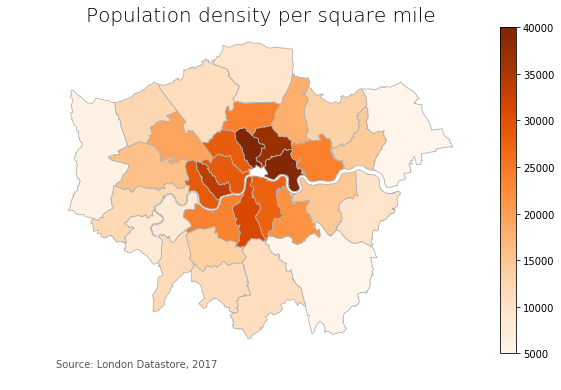

In [36]:
l_map('Pop Density', 5000, 40000, 'Oranges', 'Population density per square mile', 'Source: London Datastore, 2017', 'pop_density')

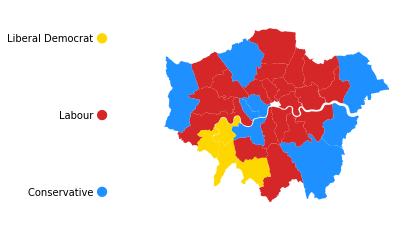

In [37]:
keys = list(borough_df2['Political control'].unique())
colors=['gold','tab:red','dodgerblue']
color_dict = dict(zip(keys,colors))

row_count = borough_df2['Political control'].nunique()
ax_list = []
for i in range(row_count+1):
    ax_list.append('ax' + str(i+1))
    ax_string = ', '.join(ax_list)

fig, (ax_string) = plt.subplots(row_count, 4)

ax1 = plt.subplot2grid((row_count,4),(0,1), rowspan=row_count, colspan=3)
for index, row in borough_df2.iterrows():
    plot = borough_df2[borough_df2['Borough'] == row['Borough']].plot(color=color_dict[row['Political control']], ax=ax1)
ax1.axis('off')

row_counter = 0
for i in borough_df2['Political control'].unique(): 
    plt.subplot2grid((row_count,4),(row_counter,0))
    plt.pie([1],labels=[i+' '],radius=0.2, colors=[color_dict[i]])
    plt.axis('off')
    row_counter += 1

# plt.savefig('Figures/political_control.png', dpi=300)

#### We can also plot choropleth graphs over folium maps

In [38]:
borough_bound = r'london_boroughs.json'

address = "London, UK"

geolocator = Nominatim(user_agent='london_explorer')
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude

park_map = folium.Map(location=[latitude, longitude], zoom_start=10, width='60', height='80', tiles='cartodbpositron')

folium.features.Choropleth(geo_data=borough_bound, data=borough_df2, columns=['Borough', 'Parks'], 
                      key_on='feature.properties.name', fill_color='Greens', fill_opacity=0.7, line_opacity=0.2).add_to(park_map)

# park_map.save('parks.html')
park_map

In [39]:
borough_bound = r'london_boroughs.json'

address = "London, UK"

geolocator = Nominatim(user_agent='london_explorer')
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude

hospital_map = folium.Map(location=[latitude, longitude], zoom_start=10, width='60', height='80', tiles='cartodbpositron')

folium.features.Choropleth(geo_data=borough_bound, data=borough_df2, columns=['Borough', 'Hospitals'], 
                      key_on='feature.properties.name', fill_color='Reds', fill_opacity=0.7, line_opacity=0.2).add_to(hospital_map)

# hospital_map.save('hospitals.html')
hospital_map

In [40]:
borough_bound = r'london_boroughs.json'

address = "London, UK"

geolocator = Nominatim(user_agent='london_explorer')
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude

supermarket_map = folium.Map(location=[latitude, longitude], zoom_start=10, width='60', height='80', tiles='cartodbpositron')

folium.features.Choropleth(geo_data=borough_bound, data=borough_df2, columns=['Borough', 'Supermarkets'], 
                      key_on='feature.properties.name', fill_color='Blues', fill_opacity=0.7, line_opacity=0.2).add_to(supermarket_map)

# supermarket_map.save('supermarkets.html')
supermarket_map

In [41]:
def getNearbyVenues(names, latitudes, longitudes, cat_id, radius=5000, LIMIT=1000):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
#         print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&categoryId={}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng,
            cat_id,
            radius,
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [42]:
hospitals = getNearbyVenues(names=borough_df2['Borough'], latitudes=borough_df2['Latitude'], longitudes=borough_df2['Longitude'], cat_id='4bf58dd8d48988d196941735')

In [43]:
hospitals.shape[0]

673

In [44]:
hospitals = hospitals.drop_duplicates(subset=None, keep='first')
hospitals.shape[0]

227

Create a dataframe of the features we want to fit to the K-Means model.

In [45]:
cluster_df = borough_df2[['Pop Density', 'Median House Price', 'Crimes per 1000', 'Schools per 1000', 'exceed_NO2', 'Parks', 'Supermarkets', 'Hospitals']]
cluster_df.head()

,Pop Density,Median House Price,Crimes per 1000,Schools per 1000,exceed_NO2,Parks,Supermarkets,Hospitals
0,12197.496523,487250.0,146.505131,0.342075,0.0,17,15,8
1,11568.392697,365000.0,168.815006,0.377749,0.0,29,21,5
2,5656.373987,440000.0,147.724916,0.381214,0.0,24,18,5
3,12688.570106,395000.0,191.272794,0.342815,0.0,13,17,5
4,16399.253731,485000.0,171.791809,0.346985,0.0,34,18,5


In [46]:
cluster_num = 3
borough_kmeans = KMeans(n_clusters = cluster_num, random_state = 0).fit(cluster_df)
borough_df2.insert(1,'Cluster_Labels', borough_kmeans.labels_)
cluster_df.insert(1,'Cluster_Labels', borough_kmeans.labels_) # For easier analysis of these features later
borough_df2.head()

,Borough,Cluster_Labels,geometry,Latitude,Longitude,Population,Area (sq mi),Pop Density,Average Age,Median House Price,Political control,Total Crimes,Crimes per 1000,School Count,Schools per 1000,NO2_value,exceed_NO2,Parks,Supermarkets,Hospitals
0,Kingston upon Thames,0,"POLYGON ((516401.600 160201.800, 516407.300 16...",51.4085,-0.3064,175400.0,14.38,12197.496523,37.1,487250.0,Liberal Democrat,25697.0,146.505131,60.0,0.342075,32.927273,0.0,17,15,8
1,Croydon,0,"POLYGON ((535009.200 159504.700, 535005.500 15...",51.3714,-0.0977,386500.0,33.41,11568.392697,37.0,365000.0,Labour,65247.0,168.815006,146.0,0.377749,31.518831,0.0,29,21,5
2,Bromley,0,"POLYGON ((540373.600 157530.400, 540361.200 15...",51.4039,0.0198,327900.0,57.97,5656.373987,40.2,440000.0,Conservative,48439.0,147.724916,125.0,0.381214,28.770732,0.0,24,18,5
3,Hounslow,0,"POLYGON ((521975.800 178100.000, 521967.700 17...",51.4746,-0.3680,274200.0,21.61,12688.570106,35.8,395000.0,Labour,52447.0,191.272794,94.0,0.342815,35.397778,0.0,13,17,5
4,Ealing,0,"POLYGON ((510253.500 182881.600, 510249.900 18...",51.5130,-0.3089,351600.0,21.44,16399.253731,36.2,485000.0,Labour,60402.0,171.791809,122.0,0.346985,36.313559,0.0,34,18,5


We can check for the optimal value of k using the elbow method.

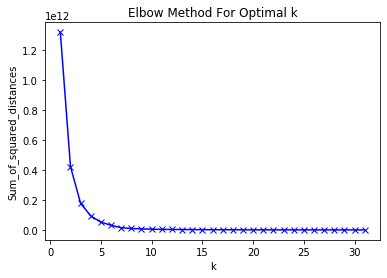

In [47]:
elbow = []

for k in range(1,len(cluster_df)):
    km = KMeans(n_clusters = k, random_state = 0).fit(cluster_df)
    elbow.append(km.inertia_)
    
K = range(1,len(cluster_df))

plt.plot(K, elbow, 'bx-')
plt.xlabel('k')  
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

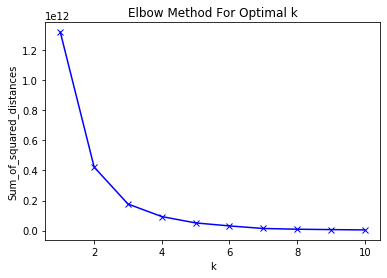

In [48]:
# Zoom in to see the elbow point more easily
elbow2 = elbow[0:10]

K = range(1,11)

plt.plot(K, elbow2, 'bx-')
plt.xlabel('k')  
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

Elbow point shows k=3 is optimal

In [49]:
# Overlay the clusters
cluster_map = folium.Map(location = [latitude, longitude], zoom_start = 10, width='60', height='80', tiles='cartodbpositron')
for lat, lng, bor, cluster in zip(borough_df2['Latitude'], borough_df2['Longitude'], borough_df2['Borough'], borough_df2['Cluster_Labels']):
    label = 'Cluster #: {} Borough: {}'.format(cluster, bor)
    label = folium.Popup(label, parse_html = True)
    if cluster == 0:
        color="blue" 
    elif cluster == 1:
        color = "purple"
    else: 
        color="red"
    folium.CircleMarker([lat, lng], 
                        radius = 5, 
                        popup = label, 
                        color = color,
                        fill = True, 
                        fill_opacity = 0.8, 
                        parse_html = False).add_to(cluster_map)
    
# cluster_map.save('initial_clusters.html')    
cluster_map

#### Analyse the cluster data

We can look to see whether there is any correlation between the cluster labels and certain features to better understand how the boroughs were clustered.

In [50]:
borough_df2.corr()['Cluster_Labels'].sort_values(ascending=False)

Cluster_Labels        1.000000
Median House Price    0.610855
NO2_value             0.519957
exceed_NO2            0.487950
Schools per 1000      0.479676
Pop Density           0.382992
Supermarkets          0.369954
Crimes per 1000       0.341027
Parks                 0.300545
Hospitals             0.295030
Total Crimes          0.101303
Average Age           0.086845
School Count         -0.073782
Latitude             -0.078520
Longitude            -0.227720
Area (sq mi)         -0.353940
Population           -0.394680
Name: Cluster_Labels, dtype: float64

In [51]:
# Create dataframes for each cluster
cluster_0 = cluster_df[cluster_df['Cluster_Labels']==0]
cluster_1 = cluster_df[cluster_df['Cluster_Labels']==1]
cluster_2 = cluster_df[cluster_df['Cluster_Labels']==2]

In [52]:
cluster_0

,Pop Density,Cluster_Labels,Median House Price,Crimes per 1000,Schools per 1000,exceed_NO2,Parks,Supermarkets,Hospitals
0,12197.496523,0,487250.0,146.505131,0.342075,0.0,17,15,8
1,11568.392697,0,365000.0,168.815006,0.377749,0.0,29,21,5
2,5656.373987,0,440000.0,147.724916,0.381214,0.0,24,18,5
3,12688.570106,0,395000.0,191.272794,0.342815,0.0,13,17,5
4,16399.253731,0,485000.0,171.791809,0.346985,0.0,34,18,5
5,5866.205306,0,350000.0,149.390484,0.357845,0.0,23,17,5
6,6738.303112,0,415000.0,174.455150,0.408638,0.0,14,9,4
7,12945.100051,0,500000.0,129.052715,0.289338,0.0,22,16,2
8,19886.227545,0,499950.0,183.803071,0.307136,0.0,41,16,7
9,11633.323380,0,533500.0,154.132444,0.418378,0.0,21,15,2


In [53]:
cluster_1

,Pop Density,Cluster_Labels,Median House Price,Crimes per 1000,Schools per 1000,exceed_NO2,Parks,Supermarkets,Hospitals
23,33974.358974,1,1315000.0,298.779874,0.597484,1.0,21,13,14
24,29203.860072,1,1025000.0,609.640644,0.413052,1.0,47,28,34


In [54]:
cluster_2

,Pop Density,Cluster_Labels,Median House Price,Crimes per 1000,Schools per 1000,exceed_NO2,Parks,Supermarkets,Hospitals
19,8899.413622,2,650000.0,130.562595,0.466295,0.0,52,16,1
21,24263.038549,2,654000.0,162.965732,0.392523,0.0,38,27,9
22,29273.301738,2,777475.0,249.152725,0.507285,1.0,31,15,5
25,28869.047619,2,760000.0,311.344330,0.445361,1.0,23,32,21
27,40278.745645,2,615000.0,255.488754,0.298443,1.0,21,22,3


The clusters are very different sizes, with cluster 1 only having 2 boroughs and cluster 0 having 25 boroughs. As such, we have to be cautious when looking at the statistics.

Median house price appeared to be the most correlated with the different clusters

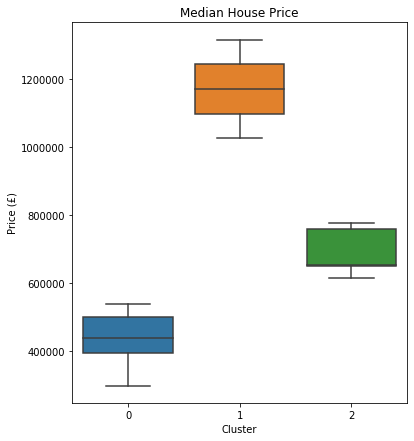

In [55]:
# Compare the median house price between clusters
plt.figure(figsize=(6,7))
ax = sns.boxplot(x='Cluster_Labels', y='Median House Price', data=borough_df2)
ax.set_xlabel('Cluster')
ax.set_ylabel('Price (£)')
ax.set_title('Median House Price')
plt.show()

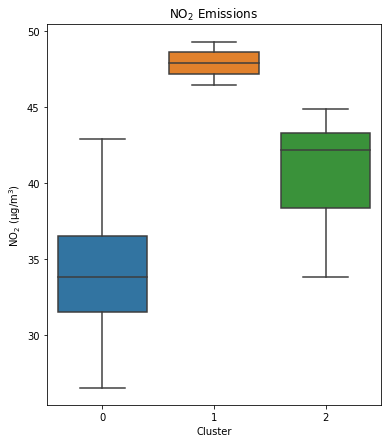

In [56]:
plt.figure(figsize=(6,7))
ax = sns.boxplot(x='Cluster_Labels', y='NO2_value', data=borough_df2)
ax.set_xlabel('Cluster')
ax.set_ylabel('NO$_2$ (µg/m$^3$)')
ax.set_title('NO$_2$ Emissions')
plt.show()

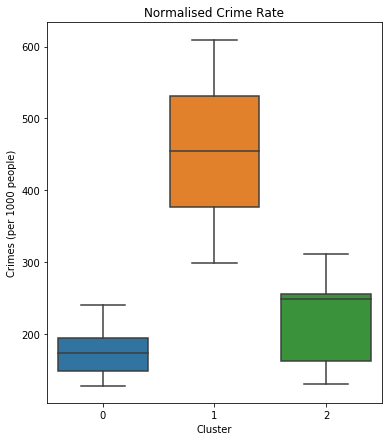

In [57]:
plt.figure(figsize=(6,7))
ax = sns.boxplot(x='Cluster_Labels', y='Crimes per 1000', data=borough_df2)
ax.set_xlabel('Cluster')
ax.set_ylabel('Crimes (per 1000 people)')
ax.set_title('Normalised Crime Rate')
plt.show()

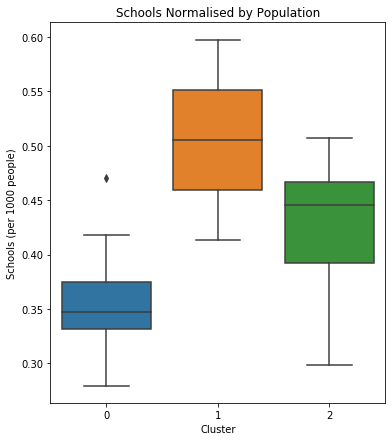

In [58]:
plt.figure(figsize=(6,7))
ax = sns.boxplot(x='Cluster_Labels', y='Schools per 1000', data=borough_df2)
ax.set_xlabel('Cluster')
ax.set_ylabel('Schools (per 1000 people)')
ax.set_title('Schools Normalised by Population')
plt.show()

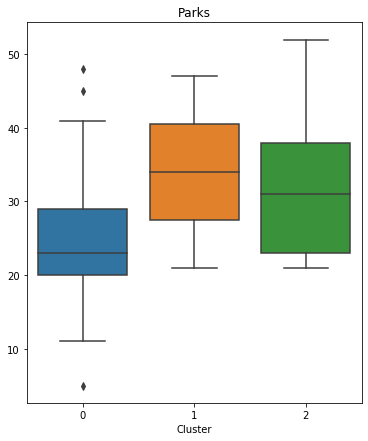

In [59]:
plt.figure(figsize=(6,7))
ax = sns.boxplot(x='Cluster_Labels', y='Parks', data=borough_df2)
ax.set_xlabel('Cluster')
ax.set_ylabel('')
ax.set_title('Parks')
plt.show()

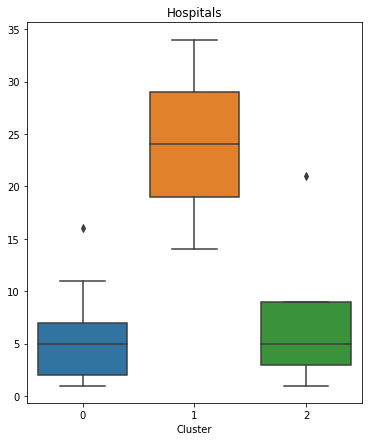

In [60]:
plt.figure(figsize=(6,7))
ax = sns.boxplot(x='Cluster_Labels', y='Hospitals', data=borough_df2)
ax.set_xlabel('Cluster')
ax.set_ylabel('')
ax.set_title('Hospitals')
plt.show()

In [61]:
cluster_0.describe()

,Pop Density,Cluster_Labels,Median House Price,Crimes per 1000,Schools per 1000,exceed_NO2,Parks,Supermarkets,Hospitals
count,25.000000,25.0,25.000000,25.000000,25.000000,25.000000,25.000000,25.000000,25.000000
mean,17353.576795,0.0,442652.400000,178.150006,0.350902,0.120000,24.800000,17.320000,5.000000
std,9198.754957,0.0,68102.513554,33.988470,0.043478,0.331662,10.193952,4.160529,3.476109
min,5656.373987,0.0,300000.000000,129.052715,0.279720,0.000000,5.000000,8.000000,1.000000
25%,11633.323380,0.0,395000.000000,149.390484,0.332018,0.000000,20.000000,16.000000,2.000000
50%,14331.955923,0.0,440000.000000,174.455150,0.346985,0.000000,23.000000,18.000000,5.000000
75%,22358.142962,0.0,499950.000000,195.537308,0.375000,0.000000,29.000000,20.000000,7.000000
max,39842.726081,0.0,540000.000000,241.011772,0.470288,1.000000,48.000000,24.000000,16.000000


In [62]:
cluster_1.describe()

,Pop Density,Cluster_Labels,Median House Price,Crimes per 1000,Schools per 1000,exceed_NO2,Parks,Supermarkets,Hospitals
count,2.000000,2.0,2.000000e+00,2.000000,2.000000,2.0,2.000000,2.000000,2.000000
mean,31589.109523,1.0,1.170000e+06,454.210259,0.505268,1.0,34.000000,20.500000,24.000000
std,3373.252123,0.0,2.050610e+05,219.811759,0.130413,0.0,18.384776,10.606602,14.142136
min,29203.860072,1.0,1.025000e+06,298.779874,0.413052,1.0,21.000000,13.000000,14.000000
25%,30396.484798,1.0,1.097500e+06,376.495067,0.459160,1.0,27.500000,16.750000,19.000000
50%,31589.109523,1.0,1.170000e+06,454.210259,0.505268,1.0,34.000000,20.500000,24.000000
75%,32781.734249,1.0,1.242500e+06,531.925452,0.551376,1.0,40.500000,24.250000,29.000000
max,33974.358974,1.0,1.315000e+06,609.640644,0.597484,1.0,47.000000,28.000000,34.000000


In [63]:
cluster_2.describe()

,Pop Density,Cluster_Labels,Median House Price,Crimes per 1000,Schools per 1000,exceed_NO2,Parks,Supermarkets,Hospitals
count,5.000000,5.0,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000
mean,26316.709434,2.0,691295.000000,221.902827,0.421982,0.600000,33.000000,22.400000,7.800000
std,11377.324827,0.0,72568.055128,73.632488,0.080493,0.547723,12.589678,7.231874,7.949843
min,8899.413622,2.0,615000.000000,130.562595,0.298443,0.000000,21.000000,15.000000,1.000000
25%,24263.038549,2.0,650000.000000,162.965732,0.392523,0.000000,23.000000,16.000000,3.000000
50%,28869.047619,2.0,654000.000000,249.152725,0.445361,1.000000,31.000000,22.000000,5.000000
75%,29273.301738,2.0,760000.000000,255.488754,0.466295,1.000000,38.000000,27.000000,9.000000
max,40278.745645,2.0,777475.000000,311.344330,0.507285,1.000000,52.000000,32.000000,21.000000


We can map the clusters over a choropleth for the house price data to demonstrate how the different clusters correlate with median house price.

Red clusters = most expensive boroughs, green = least expensive boroughs

In [64]:
cluster_map = folium.Map(location = [latitude, longitude], zoom_start = 10, width='60', height='80', tiles='cartodbpositron')


folium.features.Choropleth(geo_data=borough_bound, data=borough_df2, columns=['Borough', 'Median House Price'], 
                      key_on='feature.properties.name', fill_color='Reds', fill_opacity=0.7, line_opacity=0.2).add_to(cluster_map)

for lat, lng, bor, cluster in zip(borough_df2['Latitude'], borough_df2['Longitude'], borough_df2['Borough'], borough_df2['Cluster_Labels']):
    label = 'Cluster #: {} Borough: {}'.format(cluster, bor)
    label = folium.Popup(label, parse_html = True)
    if cluster == 0:
        color="green" 
    elif cluster == 1:
        color = "red"
    else: 
        color="yellow"
    folium.CircleMarker([lat, lng], 
                        radius = 5, 
                        popup = label, 
                        color = color,
                        fill = True, 
                        fill_opacity = 0.6, 
                        parse_html = False).add_to(cluster_map)
    
# cluster_map.save('final_clusters.html')
cluster_map

In [65]:
borough_df2.corr()['Median House Price'].sort_values(ascending=False)

Median House Price    1.000000
NO2_value             0.759405
Schools per 1000      0.722004
Crimes per 1000       0.673753
exceed_NO2            0.646326
Hospitals             0.615719
Cluster_Labels        0.610855
Pop Density           0.532429
Total Crimes          0.383191
Parks                 0.308971
Supermarkets          0.251598
Average Age           0.197557
School Count          0.026013
Latitude              0.013501
Longitude            -0.279085
Population           -0.402813
Area (sq mi)         -0.450305
Name: Median House Price, dtype: float64

From this, we can see that there are many features that seem to have a positive correlation with median house price -- such as NO2 emissions and normalised school & crime values. This is not surprising as more metropolitan areas in the centre of the city will be the most expensive, feature the most pollution and have higher crime rates. As such, as the boxplots suggest, NO2 emissions and crime rates will also differ between clusters.

### Conclusion

Analysis of the 32 main boroughs in London provided many interesting insights.

The results show that the central London boroughs feature the highest levels of crime and pollution, and are the most expensive to buy a house, thus suggesting that these boroughs would not be the most attractive for a new buyer. However, they do have higher numbers of schools (per 1000 people) and hospitals, so there are positive aspects.

Overall, there are several London boroughs that would be suitable for new Londoners who want a decent house price and low levels of crime.

### Future work / further improvements

There are many ways to expand the analysis carried out here.

##### Tailor to children
More features that are aimed at children -- such as playgrounds, swimming pools, cinemas -- could be implemented to produce a model that can cluster the boroughs based on suitability for kids. This would be particularly useful for parents who are looking to move to London.

##### Narrow by postcode
The London boroughs are quite large and there is bound to be variation between certain areas within a borough. Therefore, further analysis could explore the postcodes in London to help newcomers pick the best spot in London.